In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from TO_sim.Sol_Kuramoto import Sol_Kuramoto_mK as mK
from TO_sim.Sol_Kuramoto import Sol_Kuramoto_mf2 as mf2
from TO_sim.Get_groups import phase_diagram,make_meanr

from TO_sim.gen_Distribution import Normal
from TO_sim.gen_Distribution import Quantile_Normal as Q_Normal
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from tqdm.notebook import tqdm
from scipy.signal import find_peaks
import parmap

In [3]:
seed =10
N = 500
theta_random,omega,Kc = Normal(N,0,1,seed=seed)
omega = np.sort(omega)
m = 6
t = np.arange(0,2000,0.1)
K = 4.1
to_ppi = lambda y: (y + np.pi)%(2*np.pi) - np.pi
theta, dtheta,rs = mf2(K,N=N,m=m,t_array=t,p_theta=theta_random,p_dtheta= omega,p_omega=omega)
new_theta = to_ppi(theta)
dtheta_c = np.cumsum(dtheta,axis=0)
sum_time = 500
avg_dtheta = (dtheta_c[sum_time:]-dtheta_c[:-sum_time])/sum_time

In [12]:
n_dtheta = dtheta / np.max(abs(dtheta))

In [69]:
np.max(1- abs(n_dtheta)/2)

0.999999824476125

In [16]:
theta[0].shape

(500,)

In [85]:
def time_oscillator_dict(i):
    norm = n_dtheta[i]
    A = (1 - (norm)/2)
    theta_ = theta[i]
    sin,cos = A*np.sin(theta_), A*np.cos(theta_)
    
    return {'x':sin,'y':cos,'c':norm,'cmap':'bwr'}


def time_oscillator(i):
    norm = n_dtheta[i]
    A = (1 - (norm)/2)
    theta_ = theta[i]
    sin,cos = A*np.sin(theta_), A*np.cos(theta_)
    
    return sin,cos,norm,np.sin(theta_),np.cos(theta_)
# plt.plot(1+(n_dtheta));

In [71]:
c_ = np.linspace(-np.pi,np.pi,1000)
circle = {
    'x': np.cos(c_),'y':np.sin(c_)
}

In [72]:
from itertools import combinations,permutations


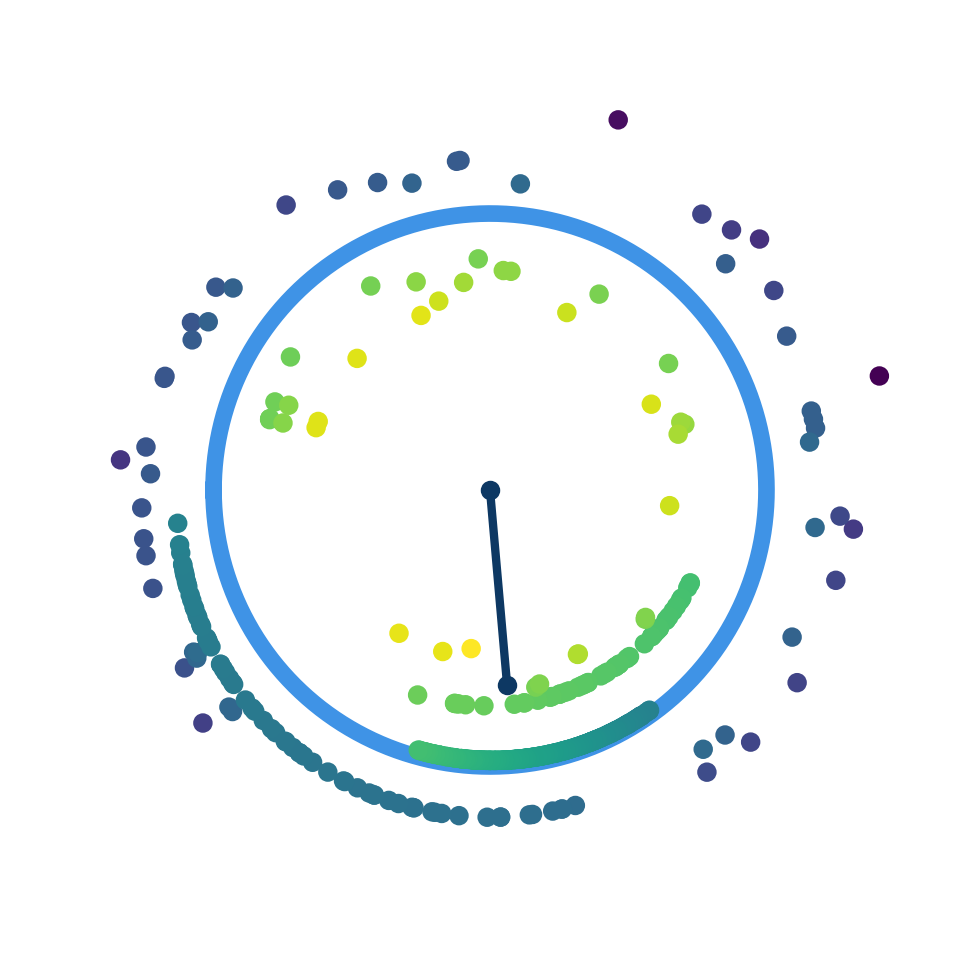

In [90]:
from itertools import combinations,permutations


i = 5200
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(5, 5),dpi=100,facecolor=(1,1,1,0))


X,Y,C_,x,y = time_oscillator(i)
ax.plot([0,np.mean(x)],[0,np.mean(y)],color='#0D3863',lw=3,marker='o')
cmap = 'bwr'
s = 100
data = {
    'x': X,'y':Y,
    'c': omega,#'cmap':cmap,
    # 'c': colors,#omega,'cmap':'YlOrRd',
}
cax = ax.scatter(**data,zorder=1)



ax.plot(np.cos(c_),np.sin(c_),zorder=0,color='#3F93E6',lw=6)
ax.set_xlim(-1.7,1.7)
ax.set_ylim(-1.7,1.7)
ax.axis('off')
# ax.text(-1.2,1.0,'(4e)',fontsize=18*multi_)
plt.tight_layout()
# ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
# plt.colorbar(cax)
# plt.savefig(f'./DATA_FILE/oscillator_N{N},r_{r[i]}.jpg',dpi=800, transparent=True)

In [91]:
fig.set_facecolor('white')
def ANI(i):
    ax.clear()
    X,Y,C_,x,y = time_oscillator(i)
    ax.plot([0,np.mean(x)],[0,np.mean(y)],color='#0D3863',lw=3,marker='o')
    cmap = 'bwr'
    s = 100
    data = {
        'x': X,'y':Y,
        'c': omega,#'cmap':cmap,
        # 'c': colors,#omega,'cmap':'YlOrRd',
    }
    cax = ax.scatter(**data,zorder=1)



    ax.plot(np.cos(c_),np.sin(c_),zorder=0,color='#3F93E6',lw=6)
    ax.set_xlim(-1.7,1.7)
    ax.set_ylim(-1.7,1.7)
    ax.axis('off')
    # ax.text(-1.2,1.0,'(4e)',fontsize=18*multi_)
    plt.tight_layout()
    # ax = plt.gca()
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)

In [88]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [79]:
t

array([0.0000e+00, 1.0000e-01, 2.0000e-01, ..., 1.9997e+03, 1.9998e+03,
       1.9999e+03])

In [80]:
len(t)//2

10000

In [92]:
idxs = range(0,len(t)//10,1)
%config InlineBackend.figure_format = 'retina'
ani = FuncAnimation(fig,ANI,frames=idxs,interval=50)
# ani.save('Groups oscillation2.mp4',dpi=400)
# ani.save('Groups oscillation m = 2, K = 2.3.mp4',dpi=400)
HTML(ani.to_html5_video())

<Figure size 640x480 with 0 Axes>

In [ ]:
idxs = range(0,len(t)//3,1)
%config InlineBackend.figure_format = 'retina'
ani = FuncAnimation(fig,ANI,frames=idxs,interval=50)
# ani.save('Groups oscillation2.mp4',dpi=400)
# ani.save('Groups oscillation m = 2, K = 2.3.mp4',dpi=400)
HTML(ani.to_html5_video())

In [ ]:
from itertools import combinations,permutations

i = Target
index = i
# fig = plt.figure(figsize=(5,5))
colors = ['#9D281B','#DC4838']

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(5, 5),dpi=500,facecolor=(1,1,1,0))
data = {
    'x': np.sin(z[:,i]),'y':np.cos(z[:,i]),
    'c': omega,'cmap':'YlGnBu',
    # 'c': colors,#omega,'cmap':'YlOrRd',
    's':800
}
X = np.sin(z[:,i])
Y = np.cos(z[:,i])
line = {
    'x':list(permutations(X,2)),
    'y':list(permutations(Y,2))
}  
# plt.plot(tempx,tempy)
lw = 1
# colors = ['#9D281B','#DC4838']
for i in range(len(line['x'])):
    ax.plot(line['x'][i],line['y'][i],color='#7FB7EF',zorder=0,lw=lw,alpha=0.1)
ax.plot([0,np.mean(X)],[0,np.mean(Y)],color='#0D3863',lw=3,marker='o')
i = index

ax.plot(np.cos(x),np.sin(x),zorder=0,color='#3F93E6',lw=6)
cax = ax.scatter(**data,zorder=1)
ax.set_xlim(-1.2,1.2)
ax.set_ylim(-1.2,1.2)
ax.axis('off')
plt.tight_layout()
# ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
# plt.colorbar(cax)
# plt.savefig(f'./DATA_FILE/oscillator_N{N},r_{r[i]}.jpg',dpi=800, transparent=True)